In [252]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
import statsmodels.api as sm
import statsmodels.formula.api as smf
import numpy as np
from scipy.stats import pearsonr
import pingouin as pg
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

# sns.set(rc={"figure.dpi":150, 'savefig.dpi':150})
sns.set_context('notebook')
sns.set_style("ticks")
plt.rcParams['svg.fonttype'] = 'none'



# Functions

In [253]:
# ------------------------------------------------------------------------------------------------------------
# Cleaning functions
# ------------------------------------------------------------------------------------------------------------
def get_max_payoff(f1, f2, cost1=0, cost2=0):
    """
    TODO: clean this up (check it works)
    """
    # data = np.zeros((11-cost2, 11-cost1))
    # for i in range(11-cost1):
        # for j in range(11-cost2):
            # data[j, i] = 10 - i - cost1 + ((i*f1 + j*f2)/2)
    # same algorithm as above but vectorized
    #data = 10 - np.arange(11-cost1) - cost1 + ((np.arange(11-cost1)[:, None]*f1 + np.arange(11-cost2)[None, :]*f2)/2)
    # Create arrays of indices
    i, j = np.indices((int(11-cost1), int(11-cost2)))

    # Compute data array
    data = 10 - i - cost1 + ((i*f1 + j*f2)/2)

    # Transpose data array to match original code
    data = data.T

    return np.amax(data), np.amin(data)


def normalize_payoff(df, with_group, cost=0):
    """
    TODO: clean this up
    """
    f1 = df['multiplier'].unique()[0]
    f2 = df['multiplier'].unique()[1]
    # matching = {}
    # for m1, m2 in ((f1, f2), (f1, f1), (f2, f1), (f2, f2)):
        # matching[(m1, m2)] = {'max': {f1: get_max_payoff(m1, m2, cost)[0], f2: get_max_payoff(m2, m1, cost)[0]},
                            #   'min': {f1: get_max_payoff(m1, m2, cost)[1], f2: get_max_payoff(m2, m1, cost)[1]}}
    
    def func(x):
        print(x)
        print('min=', get_max_payoff(x.multiplier, x.opp_multiplier, cost*x.disclose, cost*x.opp_disclose)[1])
        print('max=', get_max_payoff(x.multiplier, x.opp_multiplier, cost*x.disclose, cost*x.opp_disclose)[0])
        return (x.payoff - get_max_payoff(x.multiplier, x.opp_multiplier, cost*x.disclose, cost*x.opp_disclose)[1]) / \
        (get_max_payoff(x.multiplier, x.opp_multiplier, cost*x.disclose, cost*x.opp_disclose)[0] - \
        get_max_payoff(x.multiplier, x.opp_multiplier, cost*x.disclose, cost*x.opp_disclose)[1])

    #norm = lambda x: (x - min) / (max - min)
    if with_group:
        df['norm_payoff'] = df.apply(lambda x: (x['payoff'] - matching[(x.multiplier, get_opp(df, x.group_id, x.index))]['max'][x.multiplier]) / 
            (matching[(x.multiplier, get_opp(df, x.group_id, x.index))]['max'][x.multiplier] - 
            matching[(x.multiplier, get_opp(df, x.group_id, x.index))]['min'][x.multiplier]), axis=1)
    else:
        df['norm_payoff'] = df.apply(func=func, axis=1)
    return df

    
def get_opp(df, group_id, idx):
    return df[df['group_id'] == group_id].drop(idx)['multiplier']

def add_max_payoff(df, cost=None, with_group=True):
    if with_group:
        group_ids = df['group_id'].unique()
    f1, f2 = sorted(df['multiplier'].unique())
    df['max_payoff'] = np.NaN
    matching = {}
    for m1, m2 in ((f1, f2), (f1, f1), (f2, f1), (f2, f2)):
        matching[(m1, m2)] = [get_max_payoff(m1, m2), get_max_payoff(m2, m1)]

    if not with_group:
        for i, d in df.iterrows():
            t1 = d['multiplier']
            t2 = d['opp_multiplier']
            c1 = int(d['disclose'])
            c2 = int(d['opp_disclose'])

            max_payoff = matching[t1, t2]

            if cost:
                max_payoff = [get_max_payoff(t1, t2, cost1=cost*c1, cost2=c2*cost),
                              get_max_payoff(t2, t1, cost1=cost*c2, cost2=c1*cost)]

            df.loc[i, 'max_payoff'] = max_payoff[0]
            df.loc[i, 'opp_max_payoff'] = max_payoff[1]
        return df 


    for g in group_ids:
        d = df[df['group_id'] == g]
        if len(d) == 2:
            idx = d.index.tolist()
            t1 = d.iloc[0]['multiplier']
            t2 = d.iloc[1]['multiplier']
            c1 = d.iloc[0]['disclose']
            c2 = d.iloc[1]['disclose']

            max_payoff = matching[t1, t2]

            if cost:
                max_payoff = [get_max_payoff(t1, t2, cost1=cost*c1, cost2=c2*cost),
                              get_max_payoff(t2, t1, cost1=cost*c2, cost2=c1*cost)]

            df.loc[idx[0], 'max_payoff'] = max_payoff[0]
            df.loc[idx[1], 'max_payoff'] = max_payoff[1]
    return df


def add_norm_payoff(df, with_opp):
    df['norm_payoff'] = df['payoff']/df['max_payoff']
    if with_opp:
        df['opp_norm_payoff'] = df['opp_payoff']/df['opp_max_payoff']
    return df

def add_norm_contribution(df, cost):
    df['norm_contribution'] = df['contribution']/(10 - df['disclose']*cost)
    return df


def remove_bots(df):
    prolific_id_to_exclude = df[df['rt1'] == -1]['prolific_id'].unique()
    df = df[~df['prolific_id'].isin(prolific_id_to_exclude)]
    return df


def add_subjects(df, num):
    df['id_in_session'] = df['id_in_session'] + (num*100)
    return df


def remove_bots_but_keep_previous_rows(df):
    return df[df['rt1'] != -1]


def remove_trials_where_both_players_are_bots(df):
    group_ids = df['group_id'].unique()
    for g in group_ids:
        d = df[df['group_id'] == g]
        idx = d.index.tolist()
        rt1 = d.iloc[0]['rt1'] == -1
        rt2 = d.iloc[1]['rt1'] == -1
        if rt1 and rt2:
            df = df.drop(idx)
    return df


def remove_incomplete_sub(df, n):
    count = 0
    for i in df['prolific_id'].unique():
        count += len(df[df['prolific_id'] == i]) == n
    # exclude prolific ids with incomplete data (!= n)
    df = df[df.prolific_id.isin(
        df.prolific_id.value_counts()[df.prolific_id.value_counts() == n].index)]
    return df, count


In [130]:
get_max_payoff(2.5, 1.5, 2, 2)
10 - 2 - 8 +  ((2.5*8+ 1.5*8)/2)

(16.0, 8.0)

16.0

# Data clearning

In [137]:
exp = [
    'data/' + f for f in
    ['theresa_sorting.csv',
     'theresa_control.csv',
     'theresa_with_cost.csv',
     'theresa_single.csv',
     'cost_single_final_58.csv',
     ]
]

dfs = [pd.read_csv(f) for f in exp]

for i, d in enumerate(dfs):
   print(f'Exp {i}', f'N={count}', f'filename={exp[i]}')
   dfs[i] = remove_bots(dfs[i].copy())
   dfs[i], count = remove_incomplete_sub(
        df=dfs[i].copy(), n=63 if i in [3, 4] else 60)
   dfs[i] = add_norm_contribution(df=dfs[i].copy(), cost= 2 if i in [2, 4] else 0)
#    dfs[i] = add_max_payoff(df=dfs[i].copy(), cost=2 if i in [2, 4] else None, with_group=not i in [3,4])
#    dfs[i] = add_norm_payoff(df=dfs[i].copy(), with_opp= i in [3, 4])
   if i in [3, 4]:
      dfs[i] = normalize_payoff(dfs[i].copy(), with_group= i not in [3, 4], cost=2 if i in [2, 4] else 0)

# df = pd.read_csv('data/cost_single_final_58.csv')
    # df['prolific_id']
df = dfs[4].copy()
(df.rt1.unique()==-1).sum()
dd = df.groupby('prolific_id').multiplier.value_counts()

#

Exp 0 N=56 filename=data/theresa_sorting.csv
Exp 1 N=30 filename=data/theresa_control.csv
Exp 2 N=22 filename=data/theresa_with_cost.csv
Exp 3 N=23 filename=data/theresa_single.csv
session                               7x5f1o1h
is_bot                                       0
prolific_id           5f7c41f542eebd02c85a59ea
id_in_session                                1
idx                                          0
round_number                                 1
multiplier                                 1.5
disclose                                   1.0
contribution                                10
rt1                                       8147
rt2                                       5382
reward                                    20.0
payoff                                    20.0
total                                     20.0
individual_share                          20.0
opp_multiplier                             2.5
opp_disclose                               0.0
opp_p_disclose      

0

# Check sanity of the data

/tmp/ipykernel_130354/3926077069.py:5: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  fig1 = df.groupby('prolific_id').mean().multiplier.plot(kind='hist')
/tmp/ipykernel_130354/3926077069.py:6: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df.groupby('prolific_id', as_index=True).mean().multiplier.value_counts()


1.5    25
2.5    21
Name: multiplier, dtype: int64

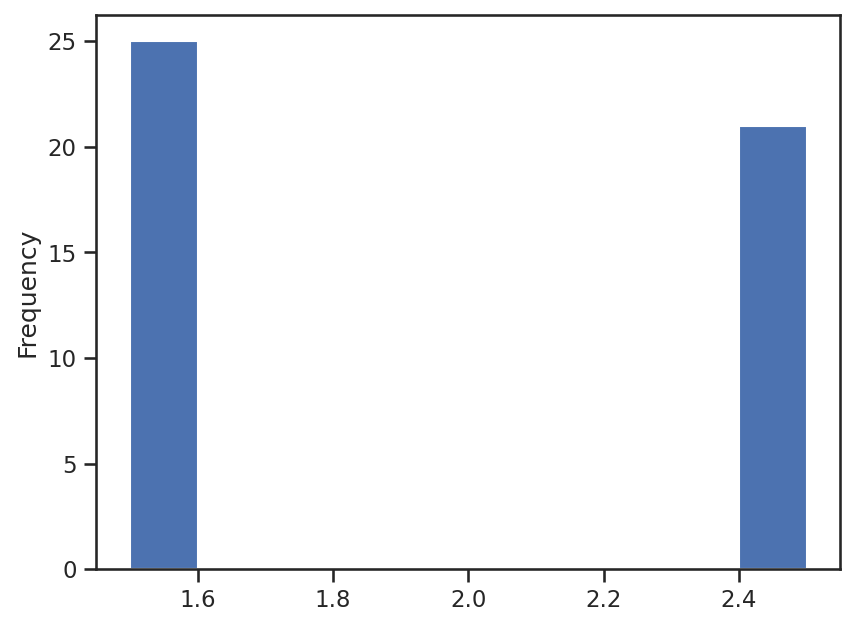

/tmp/ipykernel_130354/3926077069.py:11: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df.groupby('prolific_id').mean().opp_multiplier.value_counts()


2.0    46
Name: opp_multiplier, dtype: int64

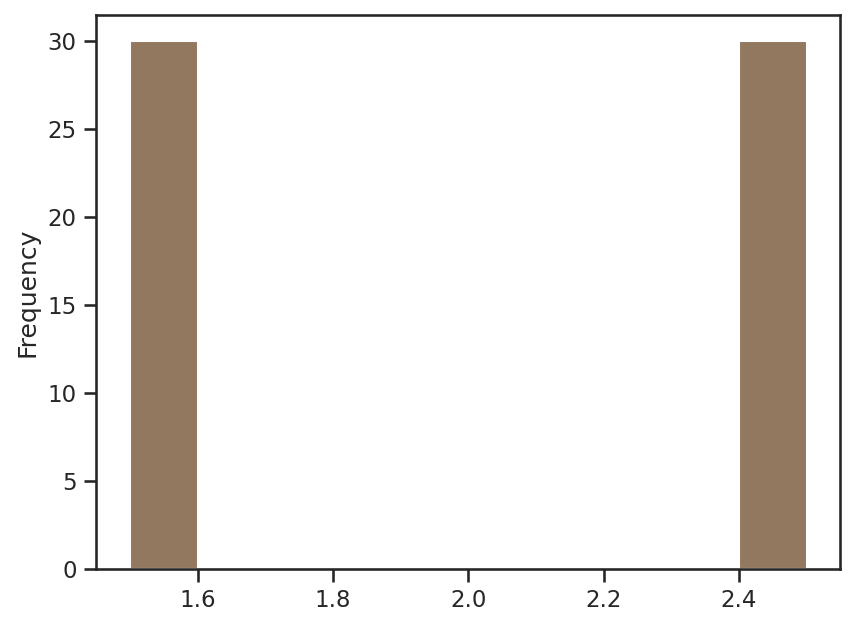

<Axes: xlabel='round_number', ylabel='opp_multiplier'>

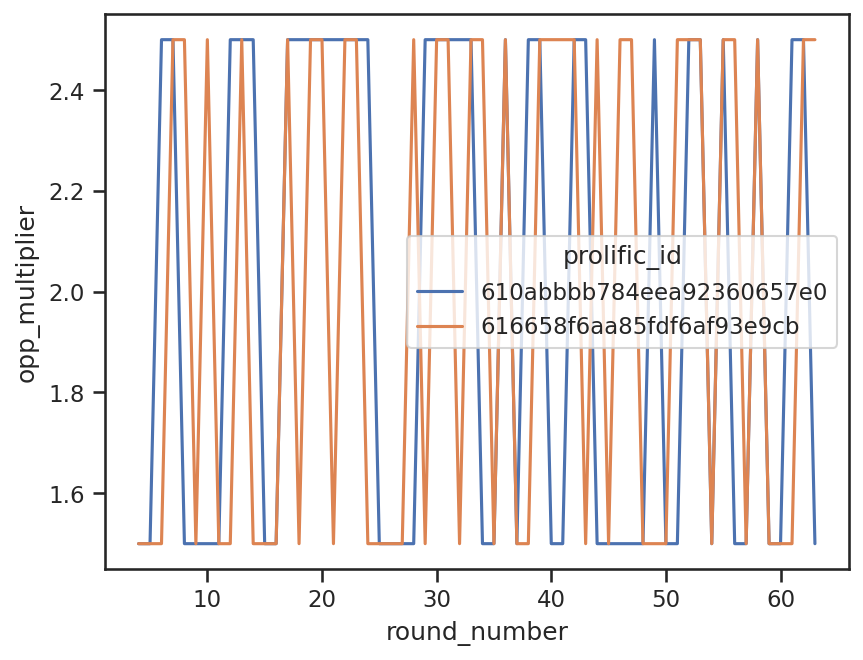

<Axes: xlabel='round_number', ylabel='opp_p_disclose'>

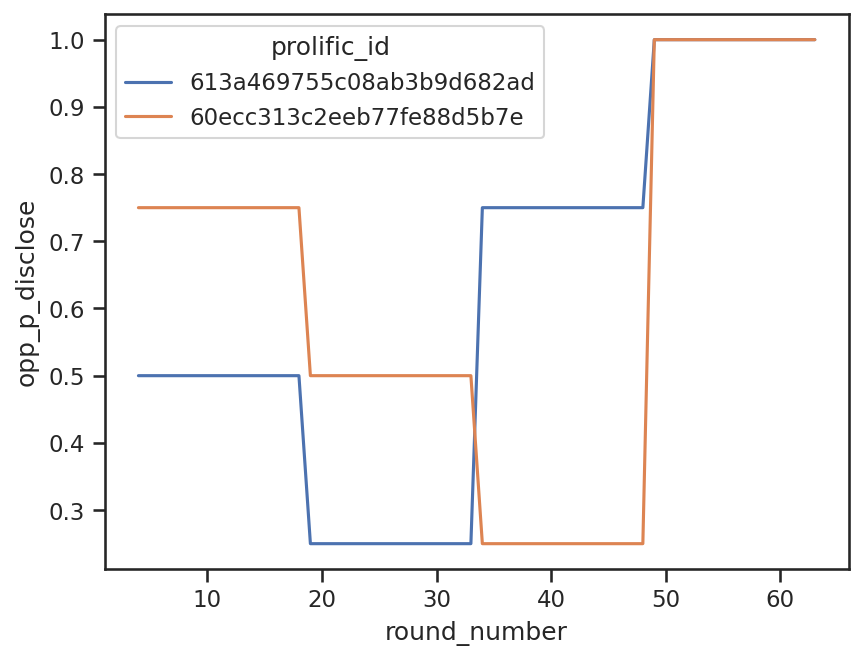

<Axes: xlabel='round_number', ylabel='opp_contribution'>

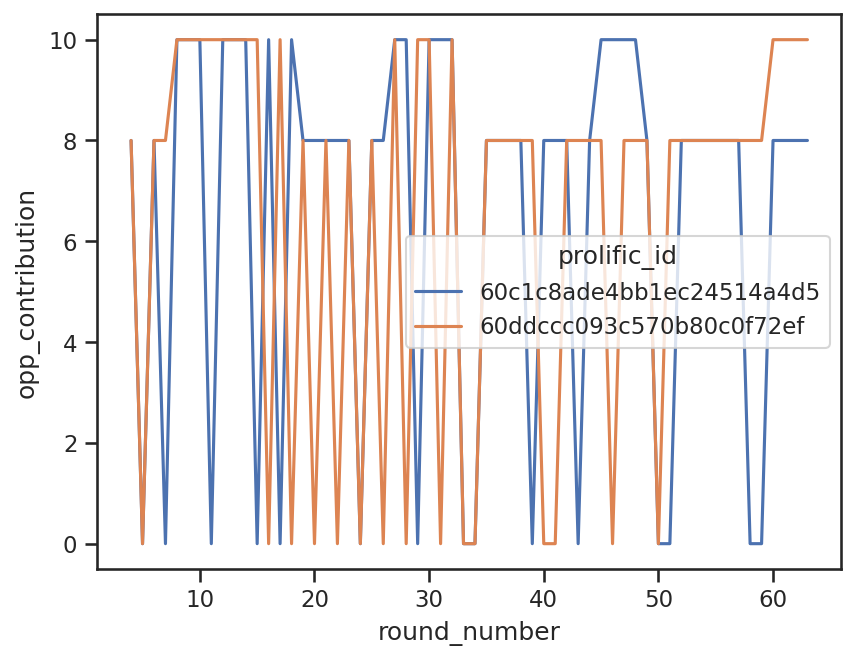

In [4]:

df = dfs[4].copy()
df = df[df.round_number>3]

# we manipulate the player multiplier (50/50)
fig1 = df.groupby('prolific_id').mean().multiplier.plot(kind='hist')
df.groupby('prolific_id', as_index=True).mean().multiplier.value_counts()
plt.show()

# we manipulate the opposant multiplier (50/50), also it is randomized across trials
fig2 = df.groupby('prolific_id').opp_multiplier.plot(kind='hist')
df.groupby('prolific_id').mean().opp_multiplier.value_counts()
plt.show()
sns.lineplot(x='round_number', y='opp_multiplier', hue='prolific_id', data=df[df.prolific_id.isin(df.prolific_id.sample(2))])
plt.show()

# we manipulate the opp p disclose
sns.lineplot(x='round_number', y='opp_p_disclose', hue='prolific_id', data=df[df.prolific_id.isin(df.prolific_id.sample(2))])
plt.show()

# we manipulate the opp contribution decision
sns.lineplot(x='round_number', y='opp_contribution', hue='prolific_id', data=df[df.prolific_id.isin(df.prolific_id.sample(2))])
# plot(x='round_number', y='opp_multiplier', legend=True)
# sns.lineplot(x='round_number', y='disclose', hue='multiplier', data=df,ci=68)

# Learning 

<Axes: xlabel='round_number', ylabel='norm_payoff'>

(0.0, 1.0)

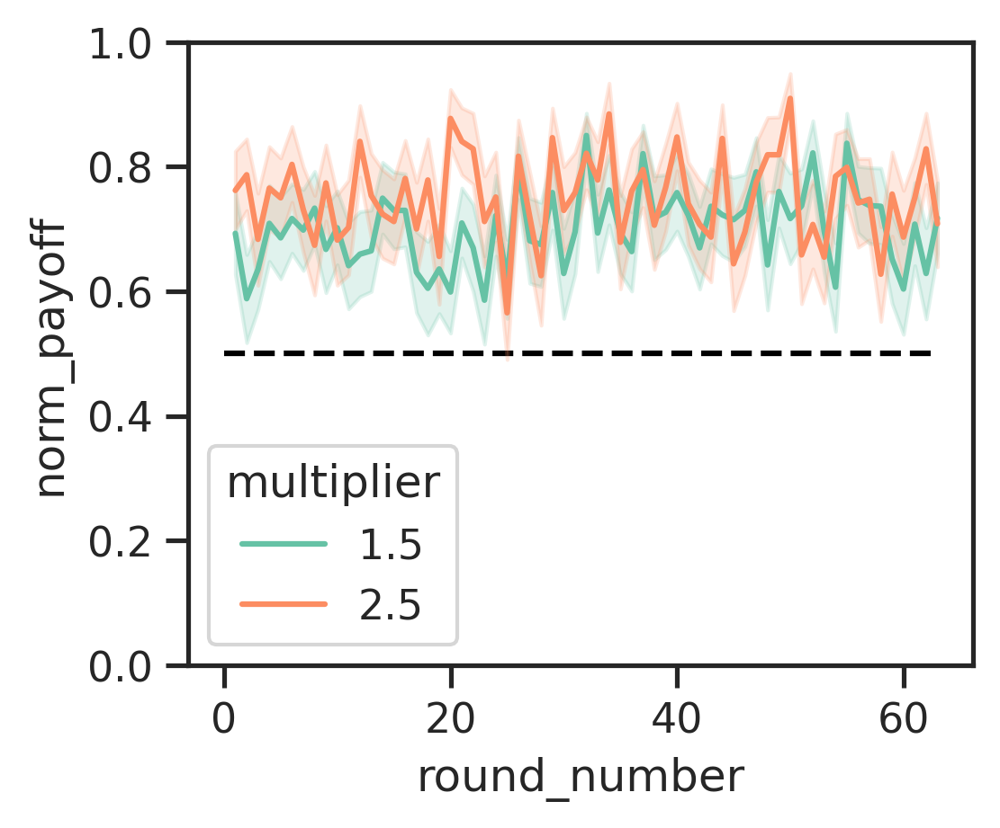

<Axes: xlabel='multiplier', ylabel='norm_payoff'>

(0.0, 1.0)

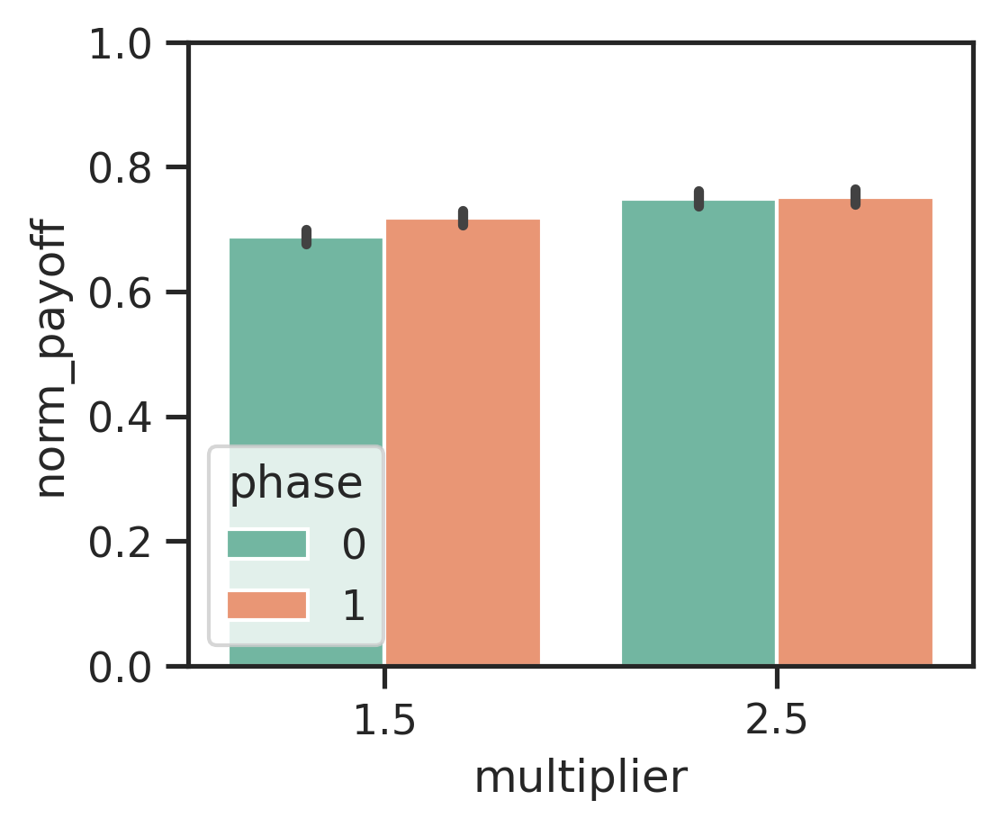

In [148]:
selected_exp = 3
df = dfs[selected_exp].copy()

sns.set_palette('Set2')

vd = 'norm_payoff'
plt.plot([0, 63], [.5, .5], zorder=0, color='black', linestyle='--')
sns.lineplot(x='round_number', y=vd, hue='multiplier', data=df, errorbar='se', palette='Set2')
plt.ylim(0,1)
plt.show()

df = df[df.round_number>3]
df['phase'] = 1
df.loc[(df.round_number<33), 'phase'] = 0

sns.barplot(x='multiplier', y=vd, hue='phase', data=df, errorbar='se', palette='Set2')
plt.ylim(0,1)
plt.show()


# Variables Corr

               multiplier opp_p_disclose opp_multiplier disclose contribution  \
multiplier            0.0            1.0            1.0      0.0          0.0   
opp_p_disclose        1.0            0.0            1.0   0.9275       0.2462   
opp_multiplier        1.0            1.0            0.0   0.8897       0.0006   
disclose              0.0         0.9275         0.8897      0.0       0.5451   
contribution          0.0         0.2462         0.0006   0.5451          0.0   
norm_payoff        0.1083         0.4963            0.0   0.6881       0.0906   

               norm_payoff  
multiplier          0.1083  
opp_p_disclose      0.4963  
opp_multiplier         0.0  
disclose            0.6881  
contribution        0.0906  
norm_payoff            0.0  


/tmp/ipykernel_130354/3324045528.py:23: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = x.corr()


<Axes: >

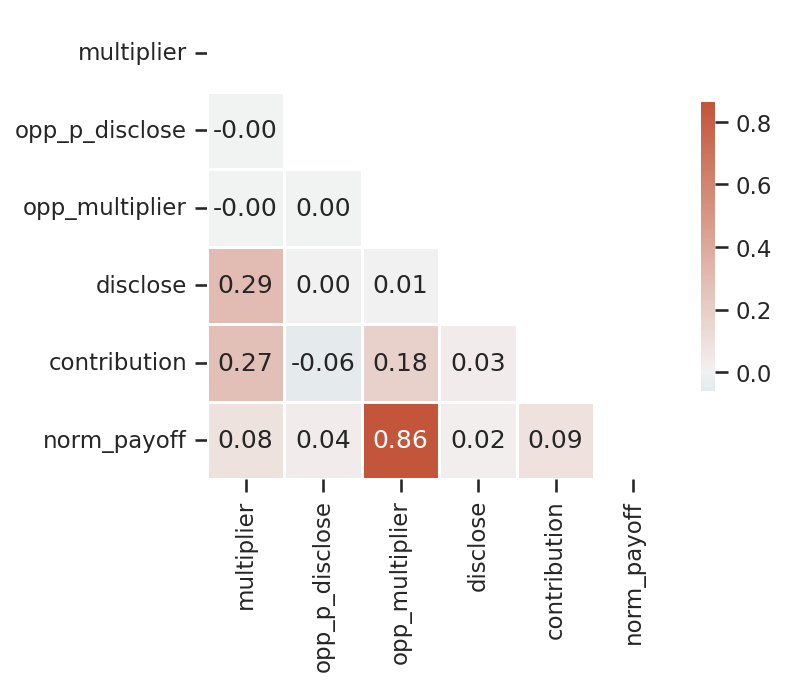

In [6]:
def calculate_pvalues(df):
    df = df.dropna()._get_numeric_data()
    dfcols = pd.DataFrame(columns=df.columns)
    pvalues = dfcols.transpose().join(dfcols, how='outer')
    for r in df.columns:
        for c in df.columns:
            pvalues[r][c] = round(pearsonr(df[r], df[c])[1], 4)
    return pvalues



selected_exp = 4
df = dfs[selected_exp].copy()
# df = df[df['round_number'] < 30]

x = df.groupby(
    ['prolific_id','multiplier','opp_p_disclose', 'opp_multiplier'], as_index=False
    )[['disclose', 'contribution', 'norm_payoff']].mean()

# y = df.groupby(['prolific_id', 'multiplier' ], as_index=False)['contribution'].mean()

# Compute the correlation matrix
corr = x.corr()
p = calculate_pvalues(x)

print(p)

# combining text with values
# formatted_text = (np.asarray(["{0}\n{1:.2f}".format(
    # text, data) for text, data in zip(p.flatten(), corr.flatten())])).reshape(3, 5)

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(5, 5))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap,  center=0, 
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=corr, fmt=".2f")

#
#

# Variables Regressions

,X,Y,method,alternative,n,r,CI95%,p-unc,p-corr,p-adjust,BF10,power
0,multiplier,disclose,pearson,two-sided,56,0.1456,"[-0.12, 0.39]",0.2843,1.0000,bonf,0.292,0.1892
1,multiplier,norm_contribution,pearson,two-sided,56,0.3684,"[0.12, 0.58]",0.0052,0.0781,bonf,7.477,0.8096
2,multiplier,contribution,pearson,two-sided,56,0.3684,"[0.12, 0.58]",0.0052,0.0781,bonf,7.477,0.8096
3,multiplier,norm_payoff,pearson,two-sided,56,0.5021,"[0.28, 0.68]",0.0001,0.0012,bonf,323.955,0.9817
4,multiplier,payoff,pearson,two-sided,56,0.9528,"[0.92, 0.97]",0.0000,0.0000,bonf,1.533e+26,1.0000
5,disclose,norm_contribution,pearson,two-sided,56,0.3692,"[0.12, 0.58]",0.0051,0.0767,bonf,7.605,0.8113
6,disclose,contribution,pearson,two-sided,56,0.3692,"[0.12, 0.58]",0.0051,0.0767,bonf,7.605,0.8113
7,disclose,norm_payoff,pearson,two-sided,56,0.0835,"[-0.18, 0.34]",0.5408,1.0000,bonf,0.2,0.0938
8,disclose,payoff,pearson,two-sided,56,0.1508,"[-0.12, 0.4]",0.2674,1.0000,bonf,0.304,0.1997
9,norm_contribution,contribution,pearson,two-sided,56,1.0000,"[1.0, 1.0]",0.0000,0.0000,bonf,inf,1.0000


<Axes: xlabel='norm_contribution', ylabel='norm_payoff'>

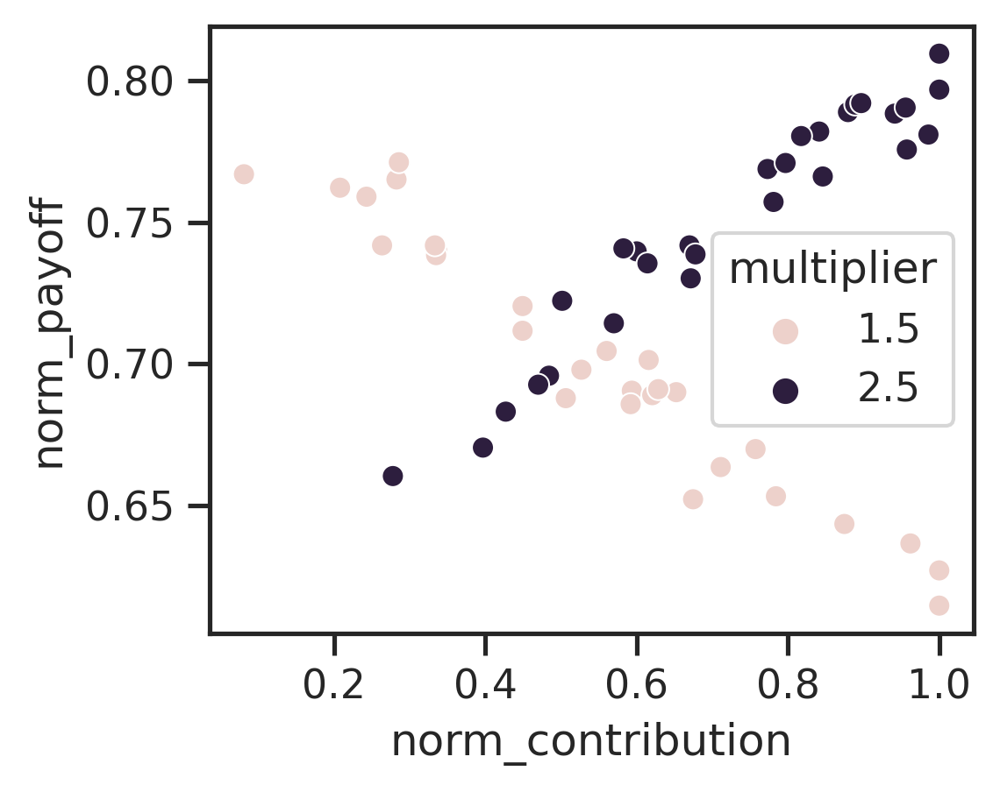

In [250]:
selected_exp = 3
df = dfs[selected_exp].copy()
pd.options.display.float_format = '{:.4f}'.format
x = df.groupby(['prolific_id', 'multiplier'], as_index=False)[['disclose', 'norm_contribution', 'contribution', 'norm_payoff', 'payoff']].mean()
pg.pairwise_corr(data=x, padjust='bonf')
sns.scatterplot(x='norm_contribution', y='norm_payoff', hue='multiplier', data=x)

In [8]:
selected_exp = 4
df = dfs[selected_exp].copy()



(0.0, 1.0)

Text(168.38055555555562, 0.5, 'payoff')

Text(0.5, 101.99999999999999, 'p(disclose)')

/home/getz/PycharmProjects/CovidGoodGameAnalysisLast/venv/lib/python3.8/site-packages/statsmodels/regression/mixed_linear_model.py:2261: ConvergenceWarning: The Hessian matrix at the estimated parameter values is not positive definite.
  warnings.warn(msg, ConvergenceWarning)
/home/getz/PycharmProjects/CovidGoodGameAnalysisLast/venv/lib/python3.8/site-packages/statsmodels/regression/mixed_linear_model.py:2261: ConvergenceWarning: The Hessian matrix at the estimated parameter values is not positive definite.
  warnings.warn(msg, ConvergenceWarning)


<class 'statsmodels.iolib.summary2.Summary'>
"""
             Mixed Linear Model Regression Results
===============================================================
Model:            MixedLM Dependent Variable: norm_contribution
No. Observations: 46      Method:             REML             
No. Groups:       46      Scale:              0.0337           
Min. group size:  1       Log-Likelihood:     -6.4379          
Max. group size:  1       Converged:          Yes              
Mean group size:  1.0                                          
---------------------------------------------------------------
                      Coef. Std.Err.   z    P>|z| [0.025 0.975]
---------------------------------------------------------------
Intercept             0.475    0.025 18.954 0.000  0.426  0.524
C(multiplier)[T.2.5]  0.191    0.082  2.338 0.019  0.031  0.351
disclose              0.033    0.121  0.275 0.783 -0.204  0.271
prolific_id Var       0.034                                    
===============================================================

"""

<class 'statsmodels.iolib.summary2.Summary'>
"""
                 Mixed Linear Model Regression Results
========================================================================
Model:                 MixedLM      Dependent Variable:      norm_payoff
No. Observations:      46           Method:                  REML       
No. Groups:            46           Scale:                   0.0420     
Min. group size:       1            Log-Likelihood:          -10.5501   
Max. group size:       1            Converged:               Yes        
Mean group size:       1.0                                              
------------------------------------------------------------------------
                              Coef.  Std.Err.   z    P>|z| [0.025 0.975]
------------------------------------------------------------------------
Intercept                      0.566    0.071  7.999 0.000  0.428  0.705
C(multiplier)[T.2.5]          -0.003    0.120 -0.022 0.983 -0.239  0.233
disclose                      -0.217    0.119 -1.818 0.069 -0.450  0.017
disclose:C(multiplier)[T.2.5]  0.255    0.263  0.968 0.333 -0.261  0.770
prolific_id Var                0.042                                    
========================================================================

"""

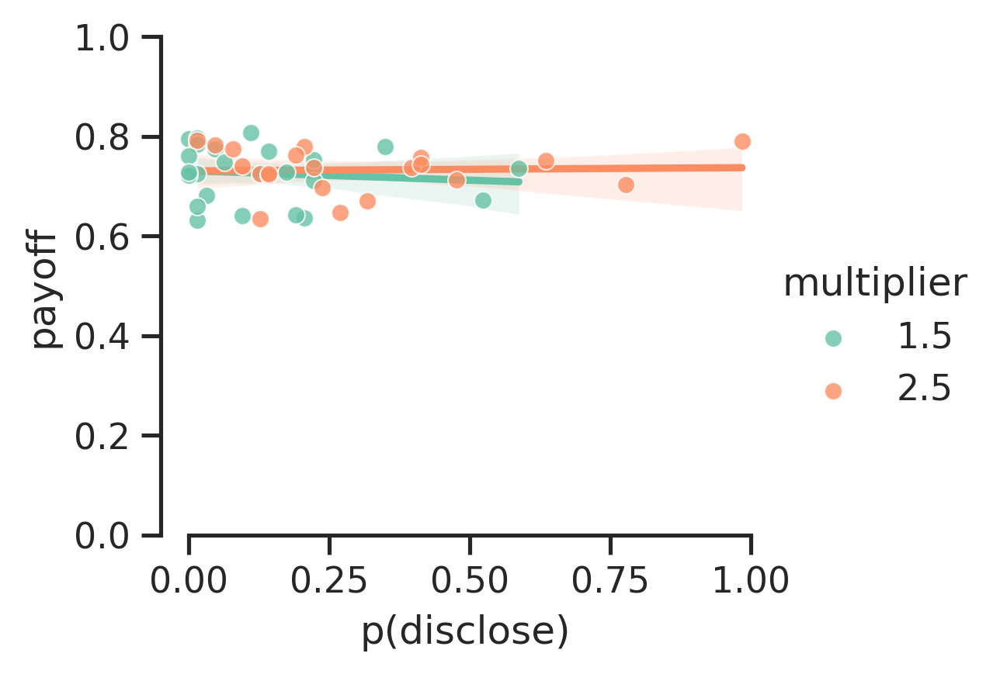

In [309]:
selected_exp = 4
df = dfs[selected_exp].copy()
# df = df[df['round_number'] > 30]

# sns.regplot(ax=axs[0],
   # x='disclose',
   # y='contribution',  data=x, scatter_kws={'clip_on': False, 'zorder': 10, 'edgecolor': 'white', 'lw': 1.5, 's': 100})
# plt.ylabel('Contribution rate')
# plt.figure(figsize=(8, 6))
sns.set(rc={'figure.figsize':(3.75, 3)})
sns.set_style('ticks')
sns.set_palette('Set2')

vd = 'norm_payoff'
x = df.groupby(['prolific_id', 'multiplier'], as_index=False)[['disclose', 'norm_contribution', 'norm_payoff', 'payoff']].mean()
sns.lmplot(
   x='disclose',
   y=vd, hue="multiplier", data=x, scatter_kws={'clip_on': False, 'zorder': 10, 'edgecolor': 'white', 'lw': .5, 's': 30}, aspect=3.75/3, height=3)
plt.ylim(0,1)
plt.ylabel('payoff')
plt.xlabel('p(disclose)')
# remove left spines and set smart bounds
sns.despine(right=True, top=True, trim=True)

plt.savefig(f'fig/fig3_exp_{selected_exp}_{vd}.svg')
# plt.show()
#
#
x = df.groupby(['prolific_id', 'multiplier'], as_index=False)[['disclose', 'norm_contribution', 'norm_payoff', 'payoff']].mean()
x['norm_payoff'] = (x.norm_payoff-x.norm_payoff.min())/(x.norm_payoff.max()-x.norm_payoff.min())

model1 = smf.mixedlm(formula='norm_contribution ~ disclose + C(multiplier)', data=x, groups='prolific_id').fit()
# model2 = smf.ols(formula='norm_contribution ~ disclose + C(multiplier)', data=x).fit()
model2 = smf.mixedlm(formula='norm_payoff ~ disclose * C(multiplier)', data=x, groups='prolific_id').fit()


model1.summary()
model2.summary()

# Logistic fit

Optimization terminated successfully.
         Current function value: 0.612702
         Iterations 5


/home/getz/PycharmProjects/CovidGoodGameAnalysisLast/venv/lib/python3.8/site-packages/statsmodels/base/model.py:127: ValueWarning: unknown kwargs ['skip_hessian']
  warnings.warn(msg, ValueWarning)
/home/getz/PycharmProjects/CovidGoodGameAnalysisLast/venv/lib/python3.8/site-packages/statsmodels/base/model.py:127: ValueWarning: unknown kwargs ['skip_hessian']
  warnings.warn(msg, ValueWarning)


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:               disclose   No. Observations:                 3528
Model:                          Logit   Df Residuals:                     3524
Method:                           MLE   Df Model:                            3
Date:                Thu, 23 Feb 2023   Pseudo R-squ.:                 0.04628
Time:                        14:57:46   Log-Likelihood:                -2161.6
converged:                       True   LL-Null:                       -2266.5
Covariance Type:            nonrobust   LLR p-value:                 3.256e-45
==========================================================================================================
                                             coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------
Intercept                                 -0.1141      0.081     -1.401      0.161      -0.274       0.046
C(multiplier)[T.2.5]                      -0.1023      0.144     -0.711      0.477      -0.385       0.180
norm_contribution                          1.0604      0.126      8.429      0.000       0.814       1.307
norm_contribution:C(multiplier)[T.2.5]     0.5129      0.203      2.531      0.011       0.116       0.910
==========================================================================================================
"""

<Figure size 1200x900 with 0 Axes>

<Figure size 1200x900 with 0 Axes>

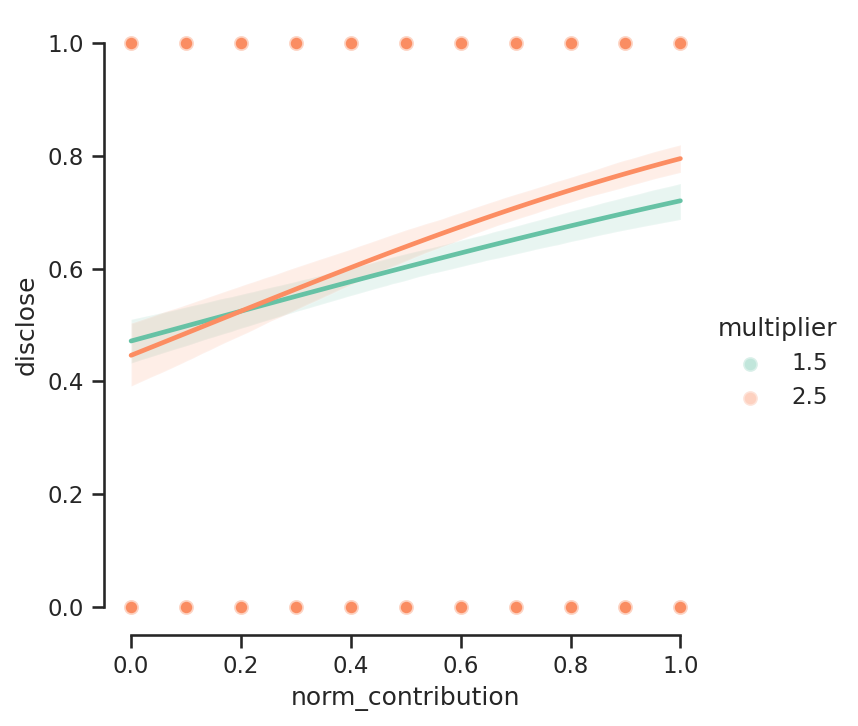

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:               disclose   No. Observations:                 3528
Model:                          Logit   Df Residuals:                     3524
Method:                           MLE   Df Model:                            3
Date:                Thu, 23 Feb 2023   Pseudo R-squ.:                 0.04628
Time:                        14:57:51   Log-Likelihood:                -2161.6
converged:                       True   LL-Null:                       -2266.5
Covariance Type:            nonrobust   LLR p-value:                 3.256e-45
==========================================================================================================
                                             coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------
Intercept                                 -0.1141      0.081     -1.401      0.161      -0.274       0.046
C(multiplier)[T.2.5]                      -0.1023      0.144     -0.711      0.477      -0.385       0.180
norm_contribution                          1.0604      0.126      8.429      0.000       0.814       1.307
norm_contribution:C(multiplier)[T.2.5]     0.5129      0.203      2.531      0.011       0.116       0.910
==========================================================================================================
"""

In [10]:
selected_exp = 3
df = dfs[selected_exp].copy()
vd = 'disclose'

model1 = smf.logit(formula='disclose ~ norm_contribution * C(multiplier)', data=df, skip_hessian=True).fit()
# model2 = smf.ols(formula='norm_payoff ~ disclose + multiplier', data=x).fit()
model1.summary()

# fig, axs = plt.subplots(1, 2)
sns.set_palette('Set2')
plt.figure(figsize=(8, 6))
sns.lmplot(
   x='norm_contribution',
   y=vd, hue='multiplier', data=df, 
   logistic=True,
   scatter_kws=dict(clip_on=False, zorder=10, alpha=.4, edgecolor='white', lw=1.5, s=50))
# plt.ylim(.7,1)
# plt.xlim(-1,11)
# remove left spines and set smart bounds
sns.despine(right=True, top=True, trim=True)
# plt.gca().spines['bottom'].set_smart_bounds(True)
plt.show()

model1.summary()

/tmp/ipykernel_131067/2422717638.py:14: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 68)` for the same effect.

  sns.barplot(


<Axes: xlabel='multiplier', ylabel='contribution'>

<Axes: xlabel='multiplier', ylabel='contribution'>

/tmp/ipykernel_131067/2422717638.py:30: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 68)` for the same effect.

  sns.barplot(


<Axes: xlabel='multiplier', ylabel='contribution'>

Text(0, 0.5, 'average contribution')

AttributeError: 'Spine' object has no attribute 'set_smart_bounds'

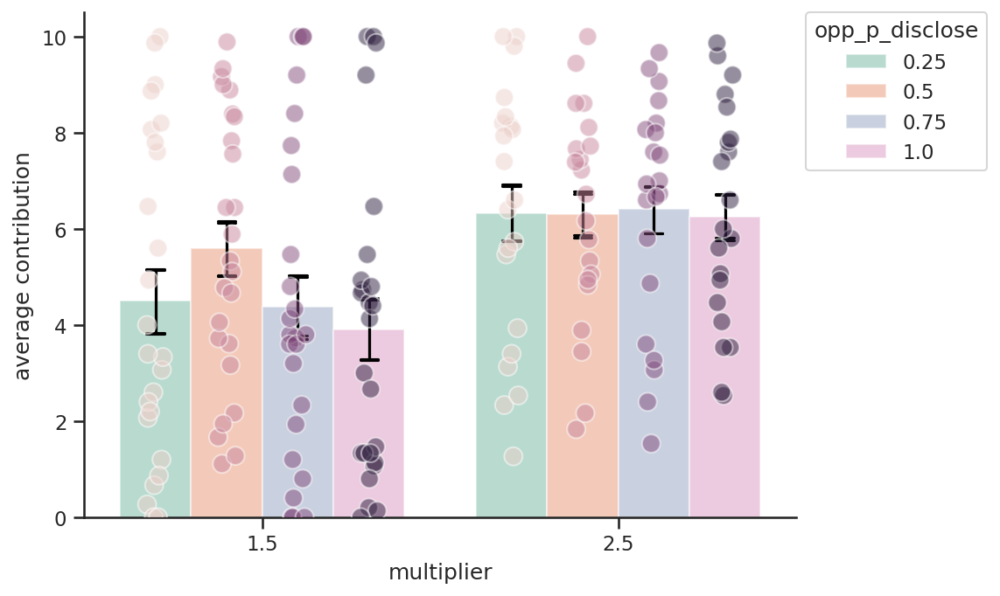

In [28]:
selected_exp = 4
df = dfs[selected_exp]

vi = 'opp_p_disclose'
vd = 'contribution'

fig, ax = plt.subplots(figsize=(7, 5))

df2 = df.groupby(['prolific_id', 'multiplier',
                    vi], as_index=False)[vd].mean()

sns.set_palette("Set2")

sns.barplot(
    x='multiplier',
    y=vd,
    hue=vi, data=df2, ci=68,
    edgecolor="white",
    errcolor="black",
    errwidth=1.5,
    capsize=0.05, 
    alpha=0.5, ax=ax, zorder=1)

# sns.pointplot()
sns.stripplot(
    x='multiplier',
     y=vd, hue=vi, data=df2, dodge=True,
              jitter=True, ax=ax, alpha=0.5, size=10, edgecolor='white', linewidth=1, zorder=5)

sns.barplot(
   x='multiplier',
   y=vd,
   hue=vi, data=df2, ci=68,
   edgecolor="white",
   errcolor="black",
   errwidth=1.5,
   capsize=0.05,
   alpha=0., zorder=10)
#


handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[4:], labels[8:], title=vi,
          bbox_to_anchor=(1, 1.02), loc='upper left')
sns.despine(right=True, top=True)

plt.ylabel(f'average {vd}')

plt.gca().spines['left'].set_smart_bounds(True)
plt.gca().spines['bottom'].set_smart_bounds(True)

df3 = df.groupby(['prolific_id', 'multiplier'], as_index=False)[vd].mean()

r = pg.ttest(x=df3[df3['multiplier'] == 1.5][vd],
         y=df3[df3['multiplier'] == 2.5][vd])
# plt.ylim(.6, 1)
print(r)
pg.mixed_anova(data=df2, dv=vd, between="multiplier", within=vi, subject='prolific_id')


In [ ]:
fig, ax = plt.subplots(figsize=(8, 8))
df2 = df.groupby(['prolific_id', 'opp_p_disclose', 'multiplier'], as_index=False)['disclose'].mean()

sns.set_palette("crest")
sns.barplot(x='multiplier', y='disclose', hue='opp_p_disclose', data=df2, ci=None, 
    edgecolor="white",
    # errcolor="black",
    # errwidth=1.5,
    # capsize = 0.05,
    alpha=0.5, ax=ax)
# sns.pointplot(x='multiplier', y='disclose', hue='opp_p_disclose', data=df2, ci=68,')

sns.stripplot(x='multiplier',y='disclose', hue='opp_p_disclose', data=df2, dodge=True, jitter=True, ax=ax, alpha=0.5, size=10, edgecolor='white', linewidth=1)

handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[4:], labels[4:], title='opp_p_disclose', bbox_to_anchor=(1, 1.02), loc='upper left')
sns.despine(right=True, top=True)

plt.ylabel('average disclosure')

plt.gca().spines['left'].set_smart_bounds(True)
plt.gca().spines['bottom'].set_smart_bounds(True)



/tmp/ipykernel_131067/4210845355.py:8: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df2 = df[df.round_number>3].groupby(['prolific_id',  'multiplier'], as_index=False).mean()


<Axes: >

<Axes: xlabel='multiplier', ylabel='disclose'>

/tmp/ipykernel_131067/4210845355.py:21: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  sns.stripplot(


<Axes: xlabel='multiplier', ylabel='disclose'>

Text(0, 0.5, 'p(disclose)')

Variable:  disclose
             T  dof alternative  p-val          CI95%  cohen-d   BF10  power
T-test -1.1524   54   two-sided 0.2542  [-0.29, 0.08]   0.3080  0.469 0.2048


<Axes: >

<Axes: xlabel='multiplier', ylabel='norm_contribution'>

/tmp/ipykernel_131067/4210845355.py:53: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  sns.stripplot(


<Axes: xlabel='multiplier', ylabel='norm_contribution'>

Text(0, 0.5, 'contribution')

Variable:  norm_contribution
             T  dof alternative  p-val           CI95%  cohen-d   BF10  power
T-test -2.9767   54   two-sided 0.0044  [-0.31, -0.06]   0.7955  9.246 0.8323


<Axes: >

<Axes: xlabel='multiplier', ylabel='norm_payoff'>

/tmp/ipykernel_131067/4210845355.py:85: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  sns.stripplot(


<Axes: xlabel='multiplier', ylabel='norm_payoff'>

Text(0, 0.5, 'payoff')

Variable:  norm_payoff
             T  dof alternative  p-val           CI95%  cohen-d    BF10  power
T-test -3.9180   54   two-sided 0.0003  [-0.39, -0.12]   1.0471  99.349 0.9705


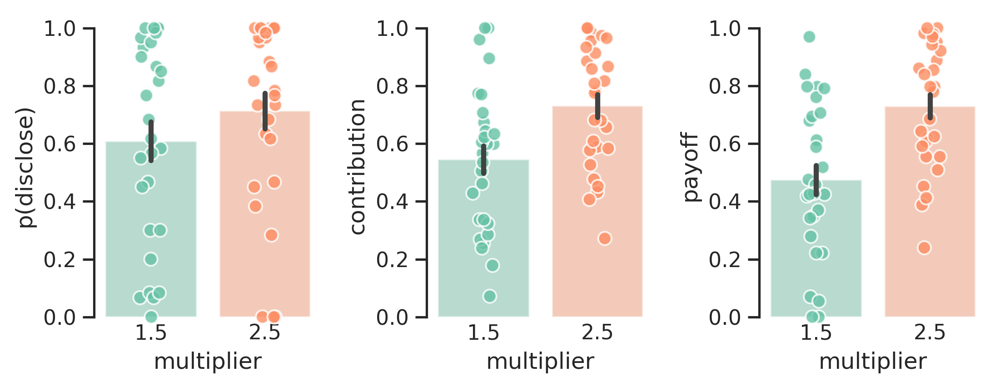

In [310]:
selected_exp = 3
df = dfs[selected_exp].copy()

sns.set({'figure.figsize': (7.5, 3), 'figure.dpi': 300})
sns.set_palette("Set2")
sns.set_style("ticks")

df2 = df[df.round_number>3].groupby(['prolific_id',  'multiplier'], as_index=False).mean()
df2['norm_payoff'] = (df2.norm_payoff-df2.norm_payoff.min())/(df2.norm_payoff.max()-df2.norm_payoff.min())

plt.subplot(1, 3, 1)
vd = 'disclose'
sns.barplot(x='multiplier', y=vd, data=df2, errorbar=('se'),
    edgecolor="white",
    # errcolor="black",
    # errwidth=1.5,
    # erralpha=0,
    # capsize = 0.05,
    alpha=0.5, zorder=0)

sns.stripplot(
    x='multiplier',
    y=vd,
    data=df2,
    alpha=0.8,
    size=7,
    linewidth=.95,
    edgecolor='white',
    zorder=1, palette='Set2', clip_on=False)

plt.ylabel('p(disclose)')
sns.despine(trim=True, bottom=False)
plt.tick_params(axis='x', length=0)

    # plt.ylim(0, 1)
r = pg.ttest(x=df2[df2['multiplier'] == 1.5][vd],
    y=df2[df2['multiplier'] == 2.5][vd])
print('Variable: ', vd)
print(r)

# same plot for norm_contribution 
plt.subplot(1, 3, 2)
vd = 'norm_contribution'

sns.barplot(x='multiplier', y=vd, data=df2, errorbar=('se'),
    edgecolor="white",
    # errcolor="black",
    # errwidth=1.5,
    # erralpha=0,
    # capsize = 0.05,
    alpha=0.5, zorder=0)

sns.stripplot(
    x='multiplier',
    y=vd,
    data=df2,
    alpha=0.8,
    size=7,
    linewidth=.95,
    edgecolor='white',
    zorder=1, palette='Set2', clip_on=False)

plt.ylabel('contribution')
sns.despine(trim=True, bottom=True)
plt.tick_params(axis='x', length=0)
# same plot for norm_payoff 
    # plt.ylim(0, 1)
r = pg.ttest(x=df2[df2['multiplier'] == 1.5][vd],
    y=df2[df2['multiplier'] == 2.5][vd])
print('Variable: ', vd)
print(r)


plt.subplot(1, 3, 3)
vd = 'norm_payoff'

sns.barplot(x='multiplier', y=vd, data=df2, errorbar='se',
    edgecolor="white",
    # errcolor="black",
    # errwidth=1.5,
    # erralpha=0,
    # capsize = 0.05,
    alpha=0.5, zorder=0)

sns.stripplot(
    x='multiplier',
    y=vd,
    data=df2,
    # jitter=1,
    alpha=0.8,
    size=7,
    linewidth=.95,
    edgecolor='white',
    zorder=1, palette='Set2', clip_on=False)


plt.ylabel('payoff')
# plt.ylim(0.6, 1.02)
sns.despine(trim=True, bottom=True)
plt.tick_params(axis='x', length=0)

r = pg.ttest(x=df2[df2['multiplier'] == 1.5][vd],
    y=df2[df2['multiplier'] == 2.5][vd])
print('Variable: ', vd)
print(r)


plt.tight_layout()
plt.savefig(f'fig/fig2_exp_{selected_exp}.svg')

<Axes: >

/tmp/ipykernel_131067/3682604793.py:18: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df2 = df.groupby(['prolific_id', 'multiplier'], as_index=False).mean()


<Axes: xlabel='multiplier', ylabel='norm_contribution'>

<Axes: xlabel='multiplier', ylabel='norm_contribution'>

Variable:  norm_contribution
             T     dof alternative  p-val          CI95%  cohen-d   BF10  \
T-test -0.9514 43.4952   two-sided 0.3466  [-0.24, 0.08]   0.2784  0.422   

        power  
T-test 0.1518  


Text(0, 0.5, 'contribution')

Variable:  norm_contribution


,Source,SS,DF,MS,F,p-unc,np2
0,discloser_type,0.0079,1.0000,0.0079,0.1180,0.7329,0.0028
1,multiplier,0.3813,1.0000,0.3813,5.6939,0.0216,0.1194
2,discloser_type * multiplier,0.0759,1.0000,0.0759,1.1339,0.2930,0.0263
3,Residual,2.8125,42.0000,0.0670,NaN,NaN,NaN


<Axes: >

/tmp/ipykernel_131067/3682604793.py:65: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df2 = df.groupby(['prolific_id', 'multiplier'], as_index=False).mean()


<Axes: xlabel='multiplier', ylabel='norm_payoff'>

<Axes: xlabel='multiplier', ylabel='norm_payoff'>

Variable:  norm_payoff
            T     dof alternative  p-val          CI95%  cohen-d   BF10  power
T-test 0.9057 43.7765   two-sided 0.3700  [-0.09, 0.24]   0.2654  0.408 0.1423


Text(0, 0.5, 'payoff')

Variable:  norm_payoff


,Source,SS,DF,MS,F,p-unc,np2
0,discloser_type,0.0884,1.0000,0.0884,1.0786,0.3049,0.0250
1,multiplier,0.0407,1.0000,0.0407,0.4963,0.4850,0.0117
2,discloser_type * multiplier,0.0226,1.0000,0.0226,0.2759,0.6022,0.0065
3,Residual,3.4436,42.0000,0.0820,NaN,NaN,NaN


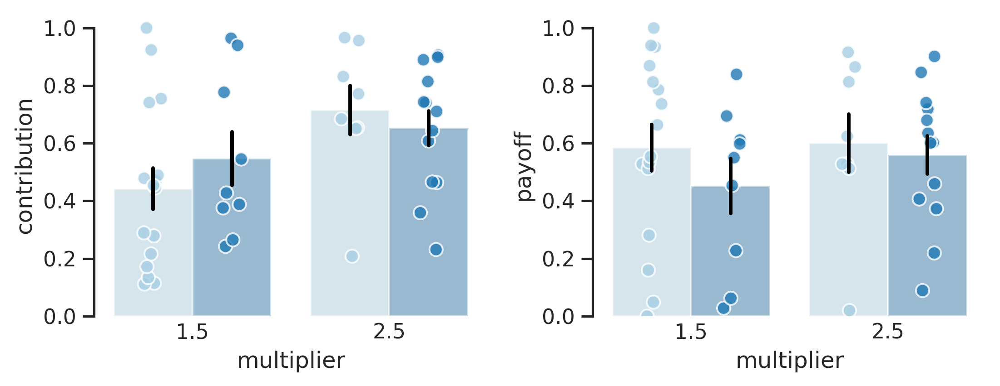

In [296]:
selected_exp = 4
df = dfs[selected_exp].copy()
# df['norm_payoff'] = (df.norm_payoff-df.norm_payoff.min())/(df.norm_payoff.max()-df.norm_payoff.min())

sns.set({'figure.figsize':(7.5, 3), 'figure.dpi': 300})
sns.set_style('ticks')
sns.set_palette("Paired")



# --------------------------------------------------------------------------------------------------------
# Figure contribution
#---------------------------------------------------------------------------------------------------------

plt.subplot(1, 2, 1)
vd = 'norm_contribution'

df2 = df.groupby(['prolific_id', 'multiplier'], as_index=False).mean()
# df2['norm_payoff'] = (df2.norm_payoff-df2.norm_payoff.min())/(df2.norm_payoff.max()-df2.norm_payoff.min())
med = df2.disclose.median()

df2['discloser_type'] = df2['disclose'].apply(lambda x: 'discloser' if x > med else 'non-discloser')

sns.barplot(x='multiplier', y=vd, data=df2, errorbar="se",
            edgecolor="white",
            hue='discloser_type',
            errcolor="black",
            errwidth=1.9,
            capsize = 0.00,
            alpha=0.5, zorder=0)

sns.stripplot(
    x='multiplier',
    y=vd,
    hue='discloser_type',
    data=df2,
    dodge=True,
    jitter=True,
    alpha=0.8,
    size=7,
    linewidth=.95,
    edgecolor='white',
    zorder=1)

r = pg.ttest(x=df2[df2['discloser_type'] == 'non-discloser'][vd],
            y=df2[df2['discloser_type'] == 'discloser'][vd])
print('Variable: ', vd)
print(r)
# break
plt.ylabel('contribution')
# plt.ylim(0.6, .8)
sns.despine(trim=True, bottom=True)
plt.tick_params(axis='x', length=0)
print('Variable: ', vd)
pg.anova(data=df2, dv=vd, between=['discloser_type', 'multiplier'])
plt.legend((), (), frameon=False)

# --------------------------------------------------------------------------------------------------------
# Figure payoff
#---------------------------------------------------------------------------------------------------------

plt.subplot(1, 2, 2)
vd = 'norm_payoff'

df2 = df.groupby(['prolific_id', 'multiplier'], as_index=False).mean()
df2['norm_payoff'] = (df2.norm_payoff-df2.norm_payoff.min())/(df2.norm_payoff.max()-df2.norm_payoff.min())
med = df2.disclose.median()

df2['discloser_type'] = df2['disclose'].apply(lambda x: 'discloser' if x > med else 'non-discloser')

sns.barplot(x='multiplier', y=vd, data=df2, errorbar="se",
            edgecolor="white",
            hue='discloser_type',
            errcolor="black",
            errwidth=1.9,
            capsize = 0.00,
            alpha=0.5, zorder=0)

sns.stripplot(
    x='multiplier',
    y=vd,
    hue='discloser_type',
    data=df2,
    dodge=True,
    jitter=True,
    alpha=0.8,
    size=7,
    linewidth=.95,
    edgecolor='white',
    zorder=1)

r = pg.ttest(x=df2[df2['discloser_type'] == 'non-discloser'][vd],
            y=df2[df2['discloser_type'] == 'discloser'][vd])
print('Variable: ', vd)
print(r)
# break
plt.ylabel('payoff')
# plt.ylim(0.6, .8)
sns.despine(trim=True, bottom=True)
plt.tick_params(axis='x', length=0)

print('Variable: ', vd)
pg.anova(data=df2, dv=vd, between=['discloser_type', 'multiplier'])
plt.legend((), (), frameon=False)

plt.tight_layout()

plt.savefig(f'fig/fig2_interaction_exp{selected_exp}.svg')

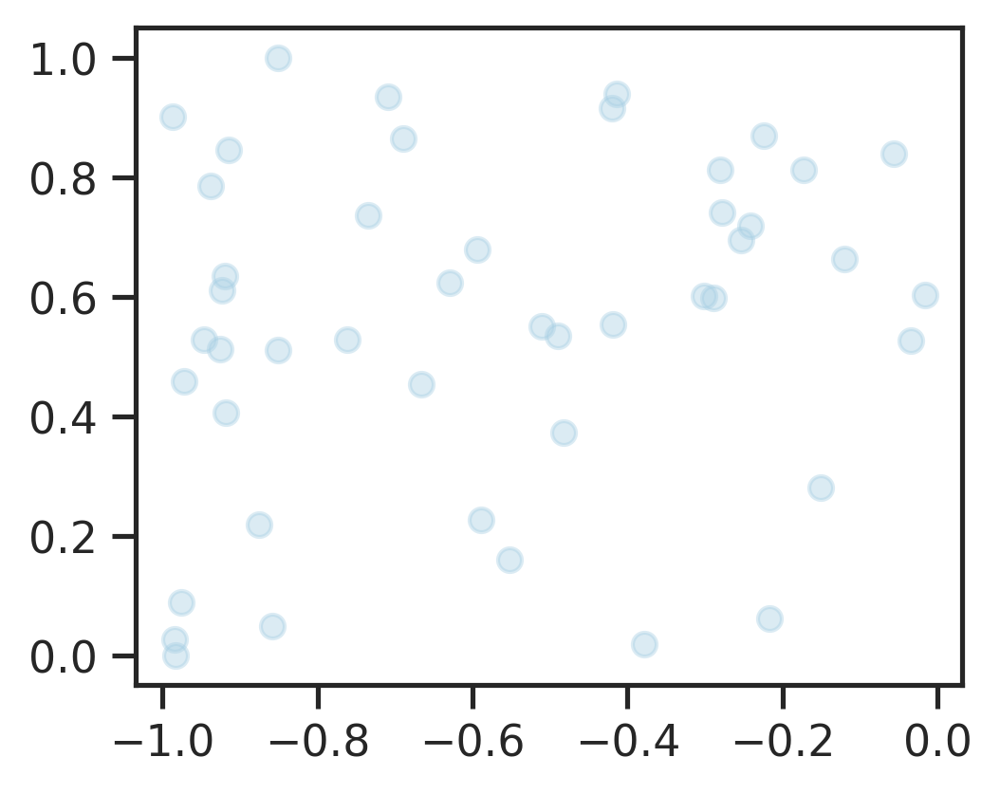

In [227]:
s = (df.groupby('prolific_id').norm_payoff.mean()-df.groupby('prolific_id').norm_payoff.mean().min())/(df.groupby('prolific_id').norm_payoff.mean().max()-df.groupby('prolific_id').norm_payoff.mean().min())
plt.scatter(x=[0, ] * len(s) + (np.random.random(size=len(s)) -1), y=s, alpha=0.4)